In [1]:
import os
import torch
from fastai.vision.all import *
from fastai.distributed import *
import fastai
import sklearn.metrics as skm

import pandas as pd
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 170)
pd.set_option('display.max_colwidth', None)
import numpy as np
from matplotlib import pyplot as plt
import openslide
from numpy import asarray
import cv2


Bad key "text.kerning_factor" on line 4 in
/home/auri/anaconda3/envs/fastaiAP/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
tcga_df = pd.read_excel('TCGA/merged_TCGA_TUM_clini_table_v1.xlsx')
print(tcga_df.shape)
print(f'n of patients {tcga_df.case_id.nunique()}')

tcga_slide_df = pd.read_excel('TCGA/merged_TCGA_TUM_slide_table_v1.xlsx')
print(tcga_slide_df.shape)
print(f'n of slides {tcga_slide_df.slide_id.nunique()}')

print(tcga_slide_df.shape, tcga_slide_df.columns)
t_merge = tcga_df[['MSIStatus', 'Organ','case_id']].merge(tcga_slide_df[['slide_id','slide_submitter_id','case_id']], on='case_id', how = 'right')



(1076, 201)
n of patients 1076
(4596, 17)
n of slides 4570
(4596, 17) Index(['slide_id', 'slide_submitter_id', 'case_id', 'case_submitter_id',
       'project_id', 'sample_id', 'sample_submitter_id', 'portion_id',
       'portion_submitter_id', 'percent_tumor_nuclei', 'percent_normal_cells',
       'percent_lymphocyte_infiltration', 'percent_neutrophil_infiltration',
       'section_location', 'percent_necrosis', 'percent_stromal_cells',
       'percent_tumor_cells'],
      dtype='object')


In [3]:
#create separate files for filtered set of images for MSS, MSI-L and MSI-H so to load them as separate projects in QuPath
path = 'Y:\\EPICOLON\\TCGA\\SVS\\'
clas = ['MSI-H','MSS','MSI-L']
for c in clas:
    t_merge['fn'] = path + t_merge['slide_submitter_id'] + '.' + t_merge['slide_id'] + '.svs' 
    msi = t_merge.loc[(t_merge.MSIStatus == c) & (t_merge.Organ.isin(['COAD','READ']))].case_id.nunique()
    msi_slide = t_merge.loc[(t_merge.MSIStatus == c) & (t_merge.Organ.isin(['COAD','READ']))].slide_id.nunique()
    print(f'n patients {c} {msi}, corresponding to {msi_slide} slides')
t_merge['fn']

n patients MSI-H 65, corresponding to 195 slides
n patients MSS 318, corresponding to 945 slides
n patients MSI-L 74, corresponding to 219 slides


0       Y:\EPICOLON\TCGA\SVS\TCGA-DM-A1D7-01A-01-TSA.da7fa2a0-e690-4593-a4e1-a3bba3c294ed.svs
1       Y:\EPICOLON\TCGA\SVS\TCGA-DM-A1D7-01Z-00-DX1.fb85be0c-1603-4d48-9e39-60165f0c3e87.svs
2       Y:\EPICOLON\TCGA\SVS\TCGA-CM-4746-01A-01-BS1.c616c706-64c5-4081-82f7-9dfc0d82fd3e.svs
3       Y:\EPICOLON\TCGA\SVS\TCGA-CM-4746-01A-01-TS1.6156fc21-ee06-451f-abb6-c7da36f92a87.svs
4       Y:\EPICOLON\TCGA\SVS\TCGA-CM-4746-01Z-00-DX1.148adc38-409d-4777-84cc-1f8bb696cf61.svs
                                                ...                                          
4591    Y:\EPICOLON\TCGA\SVS\TCGA-DD-AACN-01Z-00-DX1.e01d6f9c-75fc-4f4f-aee7-b9f0a77ebb1a.svs
4592    Y:\EPICOLON\TCGA\SVS\TCGA-DD-AADI-01A-01-TS1.1d634eee-dda5-47e0-93c4-3c5b7be4bee2.svs
4593    Y:\EPICOLON\TCGA\SVS\TCGA-DD-AADI-01Z-00-DX1.3fd0452a-a4bd-4a12-b821-71620c35bec8.svs
4594    Y:\EPICOLON\TCGA\SVS\TCGA-EP-A2KC-01A-01-TSA.f85e5978-9fa0-4783-8af2-d3108a6d2081.svs
4595    Y:\EPICOLON\TCGA\SVS\TCGA-EP-A2KC-01Z-00-DX1.c5dc9c6

In [4]:
path = Path('TCGA' )
t_merge.loc[(t_merge.MSIStatus == 'MSI-H') & (t_merge.Organ.isin(['COAD','READ'])),['fn']].to_csv(path/  'TCGA_MSI-H.csv', index = False, header = False)
t_merge.loc[(t_merge.MSIStatus == 'MSI-L') & (t_merge.Organ.isin(['COAD','READ'])),['fn']].to_csv(path/  'TCGA_MSI-L.csv', index = False, header = False)
t_merge.loc[(t_merge.MSIStatus == 'MSS') & (t_merge.Organ.isin(['COAD','READ'])),['fn']].to_csv(path/  'TCGA_MSS.csv', index = False, header = False)


In [5]:
p = Path('TCGA/MSI-H_project').ls()

In [6]:
p = Path('TCGA/MSI-H_project/TCGA-A6-5661-01A-01-TS1.7e4fdb37-bdd3-4131-a0a0-1f047a0cddea.txt')

In [7]:
tcga_slide_df[tcga_slide_df.slide_id == '76b18da0-1d51-44a1-8ac7-3024404cbc1a']

,slide_id,slide_submitter_id,case_id,case_submitter_id,project_id,sample_id,sample_submitter_id,portion_id,portion_submitter_id,percent_tumor_nuclei,percent_normal_cells,percent_lymphocyte_infiltration,percent_neutrophil_infiltration,section_location,percent_necrosis,percent_stromal_cells,percent_tumor_cells
396,76b18da0-1d51-44a1-8ac7-3024404cbc1a,TCGA-A6-2685-11A-01-TS1,e5921d6b-51cf-44be-b295-610cf7c3a69a,TCGA-A6-2685,TCGA-COAD,8365e423-d76a-4903-a90d-5332e019ee7c,TCGA-A6-2685-11A,580dd603-7f19-4c33-b450-f84a9d7baea2,TCGA-A6-2685-11A-01,--,NaN,NaN,NaN,TOP,NaN,NaN,NaN


In [8]:
import geojson
with open(p) as f:
    gj = geojson.load(f)


In [9]:
len(gj)

1682

In [10]:
tiles = [p.coordinates[0] for p in gj if p.type == 'Polygon' and len(p.coordinates[0]) == 5] #filter by those pseudosquare
len(tiles)

1420

In [11]:
def get_tile( x,y , size= (300,300) , level = 0, path = None, svs_fn = None):
        
        tma = None
        if (svs_fn == None): tma = self.TMA.img_tif
        else:
            try:
                tma = openslide.OpenSlide(os.path.join(path, svs_fn + '.svs'))
                #print(f'reading: {tma}')
            except: 
                print(f'failed: {os.path.join(path, svs_fn + ".svs")}')
                return np.nan
                
        
        img = array(tma.read_region((x,y),level,size))
        
        
        if (len(img.shape) > 2 and img.shape[2] > 3):
            img = img[:,:,:3] #remove last image dimension, so to have 3 channels and not 4 (hue)
        
        #if Spot.check_scarce_tissue(image):
        #    return np.nan
        return img

3608 2019.18
2387 2143
2794 2143
3201 2143
2387 2550
2794 2550
3201 2550
3608 2550
4422 2760.18
2387 2957
2794 2957
3201 2957
3608 2957
4015 2957
17853 3286.81
2794 3364
3201 3364
3608 3364
4015 3364
4422 3364
4829 3364
6457 3628.07
10934 3582.35
14597 3364
15411 3708.14
17446 3364
17853 3364
18260 3364
2794 3771
3201 3771
3608 3771


/home/auri/anaconda3/envs/fastaiAP/lib/python3.7/site-packages/fastai/torch_core.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if ax is None: _,ax = plt.subplots(figsize=figsize)


4015 3771
4422 3771
4829 3771
5236 3771
5643 3771
6457 3771
10934 3771
11341 3771
11748 3771
12155 3771
12562 3771
12969 3771
13376 3771
13783 3771
14190 3771
14597 3771
15004 3771
16632 4079.3
17853 3771


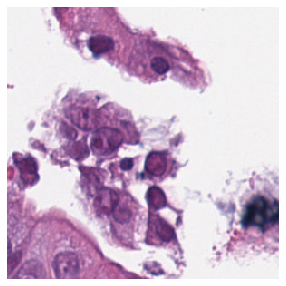

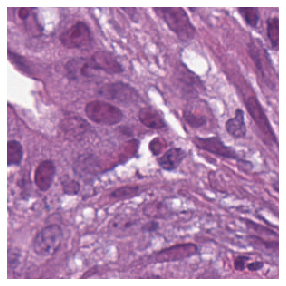

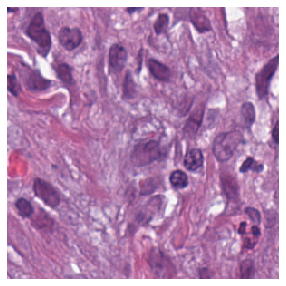

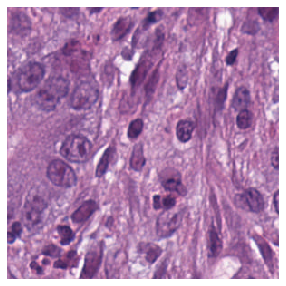

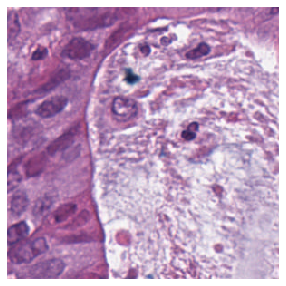

...

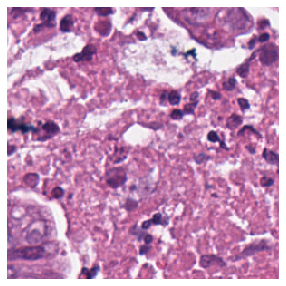

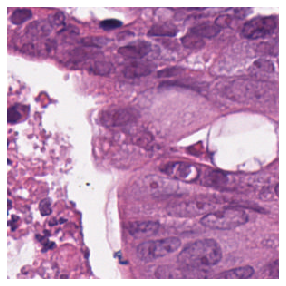

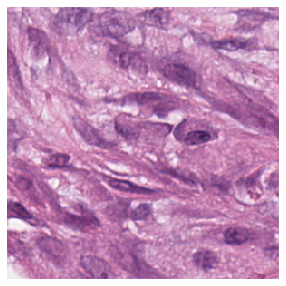

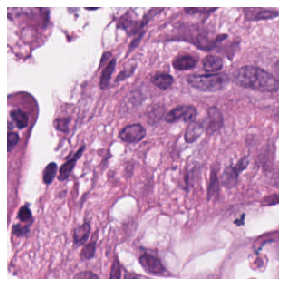

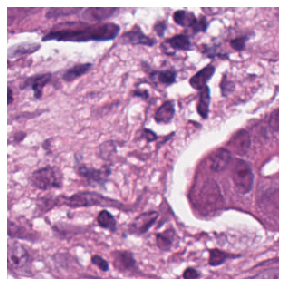

In [12]:
for i in range(0,50):
    x,y = tiles[i][0]
    print(x,y)
    show_image(get_tile(int(x),int(y), level = 0, path = path / 'SVS', svs_fn = 'TCGA-A6-5661-01A-01-TS1.7e4fdb37-bdd3-4131-a0a0-1f047a0cddea'))

[[13783, 4585], [13783, 4992], [14190, 4992], [14190, 4585], [13783, 4585]]


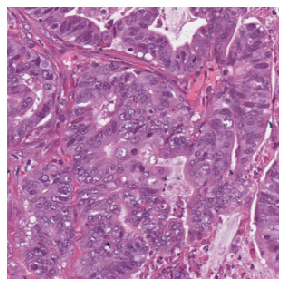

In [13]:
i = 100
print(tiles[i])
x,y = tiles[i][0]
show_image(get_tile(int(x),int(y), level = 1, path = path / 'SVS', svs_fn = 'TCGA-A6-5661-01A-01-TS1.7e4fdb37-bdd3-4131-a0a0-1f047a0cddea'))

### Inference

In [14]:
def get_x(r):
    img = get_tile(r.x,r.y, level = r.level, path = r.path, svs_fn = r.svs_fn)
     
    return img

def get_y(r): return  r.label

In [15]:
calculate_stats = False
if calculate_stats:
    dls = spots_datablock.dataloaders(path, bs = 5000)
    print (dls[0].after_batch)
    bx=dls.one_batch()[0]
    print(bx.min(),bx.max(),bx.mean(dim=[0,2,3]),bx.std(dim=[0,2,3]))
    tissue_stats = (np.array(bx.mean(dim=[0,2,3]).cpu()),np.array(bx.std(dim=[0,2,3]).cpu()))
    print(tissue_stats)
else: 
    tissue_stats =  ([0.7700158 , 0.6154052 , 0.74566764],[0.19486967, 0.26420233, 0.19368471])
tissue_stats

([0.7700158, 0.6154052, 0.74566764], [0.19486967, 0.26420233, 0.19368471])

In [16]:
datablock = DataBlock(blocks=(ImageBlock,CategoryBlock),
                            get_x=get_x,
                            get_y=get_y,
                            batch_tfms=Normalize.from_stats(*tissue_stats),
                            splitter=RandomSplitter(valid_pct=0, seed=None),
                           )

In [17]:
suffix = 'MSI-H'  # 'MSS'
tiles_txt = Path(f'TCGA/{suffix}_project').ls(file_exts = '.txt')
svs = Path('TCGA/SVS').ls(file_exts = '.svs')
txt = [t.name[:-4] for t in tiles_txt]
svs = [t.name[:-4] for t in svs]
txt = set(txt) & set(svs)
tiles_txt = [Path(f'TCGA/{suffix}_project/{t}.txt') for t in txt]
print(len(tiles_txt))

124


In [20]:
import geojson
columns = ['tile','path','svs_fn','patient_ID', 'label', 'clas_idx', 'probs']
d = pd.DataFrame( columns = columns)
def process_slide(slide, size = (300,300), level = 0): #slide is a txt with arrays of polygons extracted by QPath from one WSI image

    slide = Path(slide)
    
    f = open(slide)
    gj = geojson.load(f)
    f.close()
    tiles = [p.coordinates[0] for p in gj if p.type == 'Polygon' and len(p.coordinates[0]) == 5] #filter by those pseudosquare
    tiles = np.array(tiles)
    df = pd.DataFrame(columns = columns)
    try:
        
        assert tiles.ndim == 3
        


        label = 1 if slide.parent.name == 'MSI-H_project' else 2
        print(label)
        svs_name = slide.name.strip('.txt')
        print(svs_name)
        
        df['x'] = pd.Series(tiles[:,0,0]).astype(int)
        df['y'] = pd.Series(tiles[:,0,1]).astype(int)
        df['level'] = level
        df['tile'] = df.apply(lambda o: [o.x, o.y, size, o.level], axis = 1)
        df['path'] = path / 'SVS'
        df['svs_fn'] = svs_name
        df['label'] = label
        df['patient_ID'] = '-'.join(svs_name.split('-')[:3])

        learn = None
        if not learn:
            bs = 15
            dls = datablock.dataloaders(df[:15], bs = bs)
            learn = cnn_learner(dls, resnet34, metrics=[error_rate,RocAuc()],normalize=False, n_out=9)
            tissue_model = Path('pretrained_tissue_aug_BAC_epicolon0.9993681800971788')
            learn.load(tissue_model)



        #print('starting to predict')
        #predict
        sample_tiles = learn.dls.test_dl(df)
        probs, classes, clas_idx = learn.get_preds(dl=sample_tiles, with_input=False, with_decoded=True)
        #print(probs.shape, clas_idx.shape)

        probs = [list(np.around(ps.numpy(),decimals = 2)) for ps in probs ]
        df['probs'] = probs
        df['clas_idx'] = clas_idx
        #print(df.clas_idx.value_counts())

    except:
        print('failed: ' + slide.name)
        pass
        
        #print(df.shape)
    return df[columns],(learn,sample_tiles)

    



In [21]:
level = 0
result = [process_slide(slide, size = (300,300), level = 0)  for slide in tiles_txt[:1]]
#ds = pd.concat((*result,))
#print(ds.shape)
#ds.to_csv(f'dataset_TCGA_{suffix}_level_{level}_no_overlap_labeled_tissue.csv')

1
TCGA-D5-6928-01A-01-TS1.18464c5d-7dd8-453c-8772-18797e5753af


In [33]:
(_,(learn,sample_tiles))= result[0]
sample_tiles.__dict__

{'after_item': Pipeline: ToTensor,
 'before_batch': Pipeline: ,
 'after_batch': Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Normalize -- {'mean': tensor([[[[0.7700]],
 
          [[0.6154]],
 
          [[0.7457]]]], device='cuda:0'), 'std': tensor([[[[0.1949]],
 
          [[0.2642]],
 
          [[0.1937]]]], device='cuda:0'), 'axes': (0, 2, 3)},
 '__stored_args__': {'dataset': (#803) [(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=300x300,)...],
  'bs': 15,
  'shuffle': False,
  'drop_last': False,
  'indexed': True,
  'n': 803,
  'pin_memory': False,
  'timeout': 0,
  'device': device(type='cuda', index=0)},
 'dataset': (#803) [(PILImage mode=RGB size=300x300,),(PILImage mode=RGB size=

In [ ]:
ds.loc[ds.clas_idx == 8].patient_ID.value_counts() 

In [ ]:
def load_tiles(polygon_list, level = 0, size = (300,300), suffix = 'MSS'):
    
    try:
        p_ds = f'dataset_TCGA_{suffix}_level_{level}_no_overlap_labeled_tissue.csv'
        ds = pd.read_csv(p_ds)
        #ds = pd.concat([load_dataset(0)])
        ds['tile']=ds['tile'].apply(eval)
    except:
        print('failed')
        # res = parallel(partial(process_slide, size = size, level = level),polygon_list) #does not work 
        # ds = pd.concat((*res,))
        # ds.to_csv(p_ds,index=False)
    return ds

In [ ]:
#torch.multiprocessing.set_start_method('spawn', force = True)
d = load_tiles(tiles_txt)

In [ ]:
cls = ['ADI', 'BAC', 'DEB', 'LYM', 'MUC', 'MUS', 'NOR', 'STR', 'TUM']
for r in d[3310:3320].iterrows():
    r = r[1]
    if (r.clas_idx >= 0):
        print(cls[r.clas_idx])
        x = r.tile[0]
        y = r.tile[1]
        level = r.tile[3]
        svs_fn = r.svs_fn
        show_image(get_tile(x,y, level = level, path= r.path, svs_fn = svs_fn))